In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import os
import glob

# Charger Google Drive
from google.colab import drive
drive.mount('/content/drive')


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


# Configuration de l'environnement et préparation des données

In [ ]:
# Chemin du dataset contenant les images
dataset_path = '/content/drive/MyDrive/imageechequier'

# Dimensions de la grille (nombre de coins intérieurs)
CHECKERBOARD = (6, 9)
criteria = (cv2.TERM_CRITERIA_EPS + cv2.TERM_CRITERIA_MAX_ITER, 30, 0.001)

# Préparer les points 3D pour l'échiquier
objp = np.zeros((CHECKERBOARD[0] * CHECKERBOARD[1], 3), np.float32)
objp[:, :2] = np.mgrid[0:CHECKERBOARD[1], 0:CHECKERBOARD[0]].T.reshape(-1, 2)

# Axes 3D pour visualisation (agrandis)
axis = np.float32([[6, 0, 0], [0, 6, 0], [0, 0, -6]]).reshape(-1, 3)

# Charger les images
formats = ('*.jpg', '*.jpeg', '*.png')
images = [img for fmt in formats for img in glob.glob(os.path.join(dataset_path, fmt))]

if not images:
    print(f"Aucune image trouvée dans le chemin : {dataset_path}")
    exit()


# Détection des coins dans les images

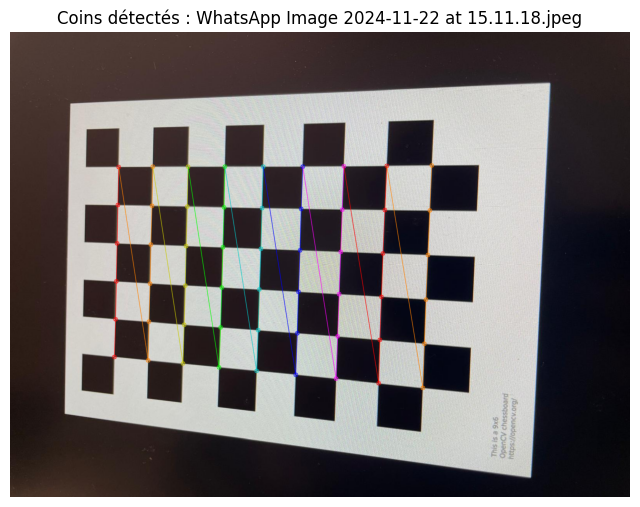

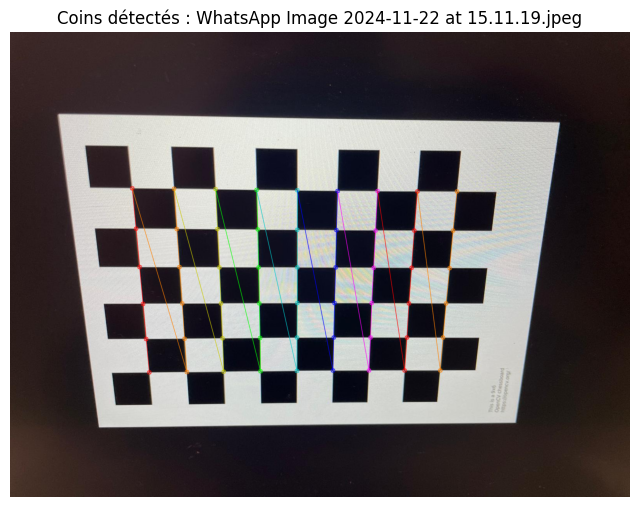

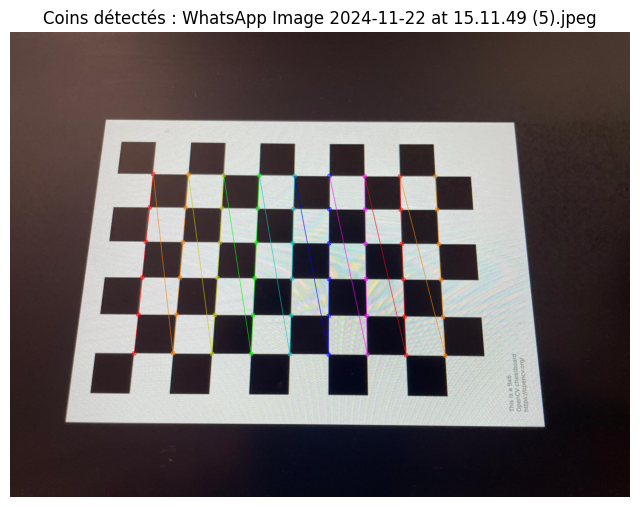

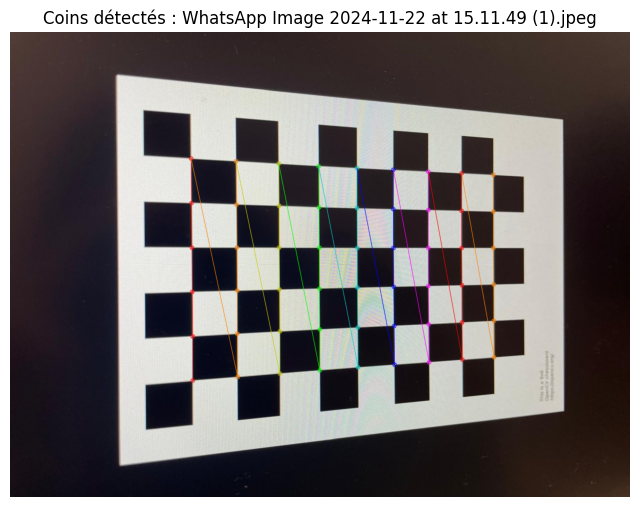

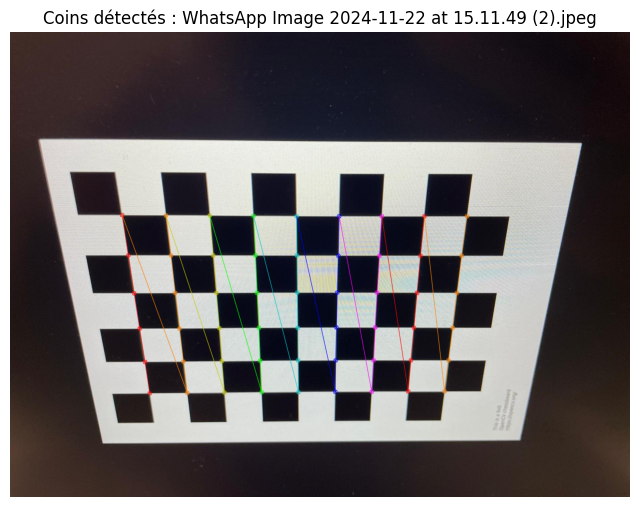

...

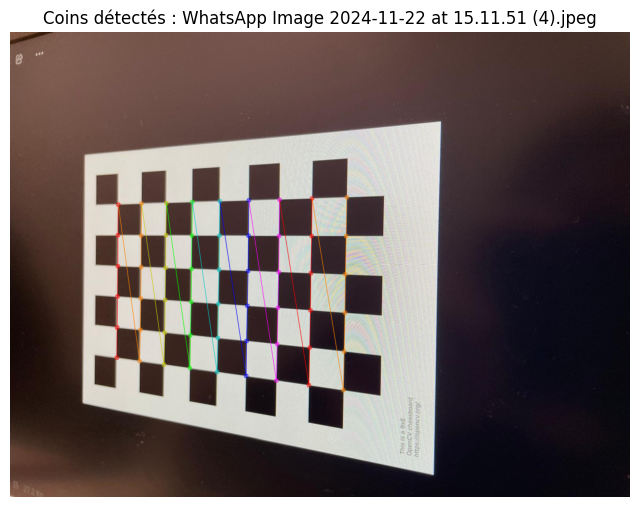

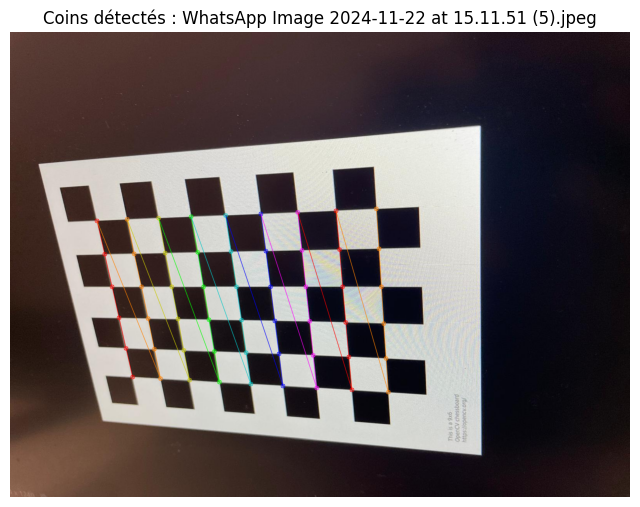

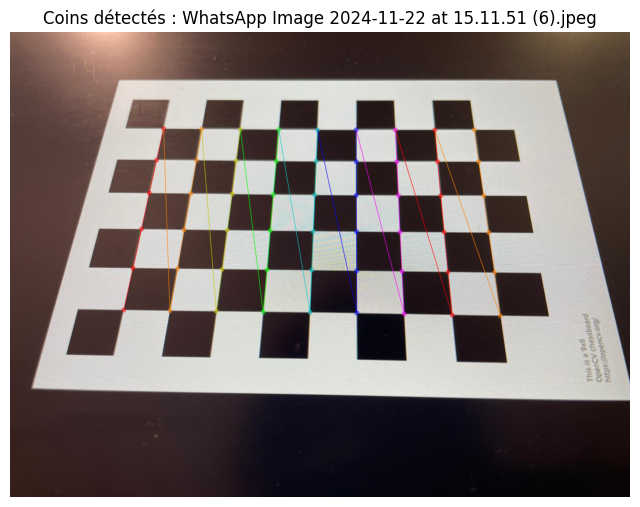

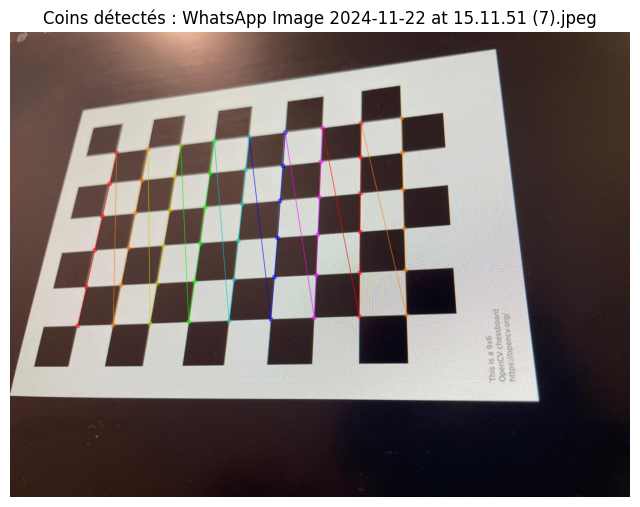

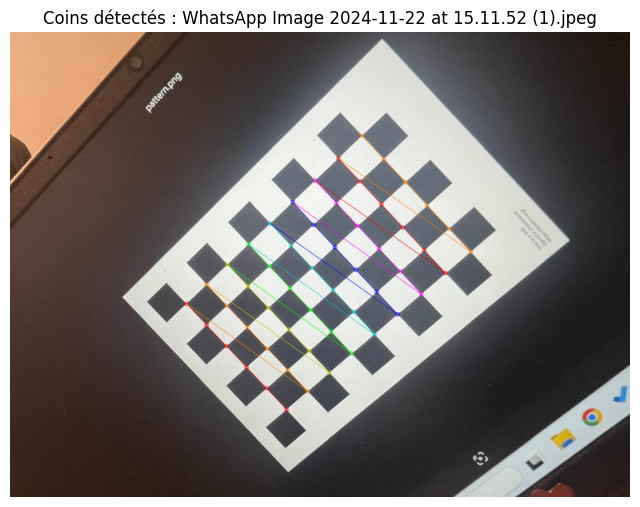

In [ ]:
# Points 3D et 2D détectés
objpoints = []  # Points 3D dans le monde réel
imgpoints = []  # Points 2D dans les images

# Détection des coins sur chaque image
for fname in images:
    img = cv2.imread(fname)
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    ret, corners = cv2.findChessboardCorners(gray, CHECKERBOARD, None)

    if ret:
        objpoints.append(objp)
        refined_corners = cv2.cornerSubPix(gray, corners, (11, 11), (-1, -1), criteria)
        imgpoints.append(refined_corners)

        # Visualisation des coins détectés
        img = cv2.drawChessboardCorners(img, CHECKERBOARD, refined_corners, ret)
        plt.figure(figsize=(8, 8))
        plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
        plt.axis('off')
        plt.title(f"Coins détectés : {os.path.basename(fname)}")
        plt.show()
    else:
        print(f"Coins non détectés dans l'image {fname}.")

if not objpoints or not imgpoints:
    print("Erreur : Aucun point détecté. Vérifiez vos images et les dimensions de l'échiquier.")
    exit()


# Calibration de la caméra

In [ ]:
# Calibration de la caméra
ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, gray.shape[::-1], None, None)
print("Matrice de la caméra :\n", mtx)
print("Coefficients de distorsion :\n", dist)


Matrice de la caméra :
 [[3.67265867e+04 0.00000000e+00 9.69114795e+02]
 [0.00000000e+00 8.90778096e+04 3.53061303e+02]
 [0.00000000e+00 0.00000000e+00 1.00000000e+00]]
Coefficients de distorsion :
 [[-4.47006597e+02  1.13582328e+04  1.44530804e+00 -2.45354265e+00
   6.60686542e+01]]


# Visualisation des axes 3D projetés

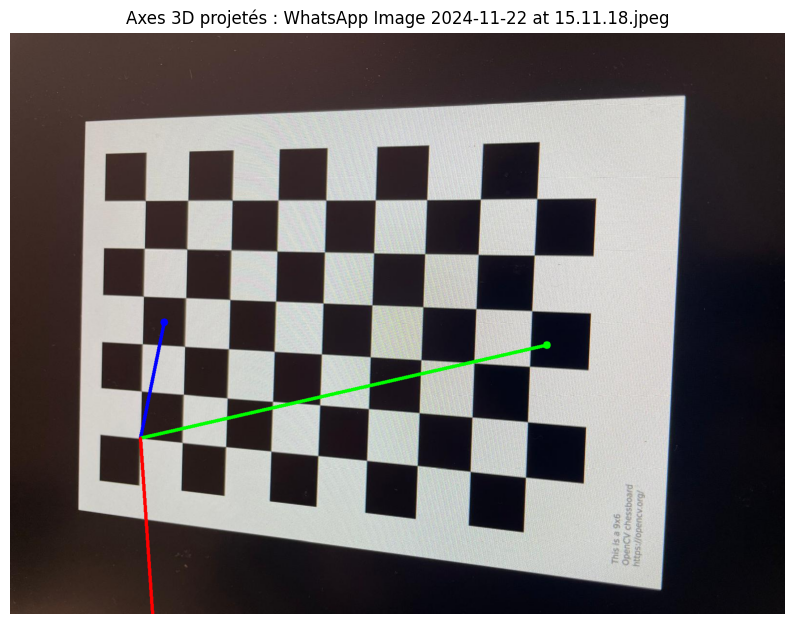

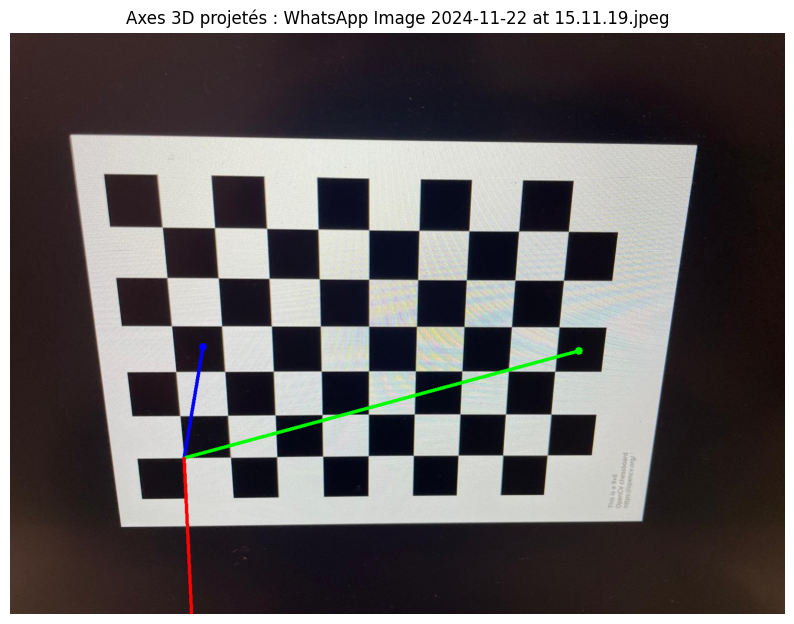

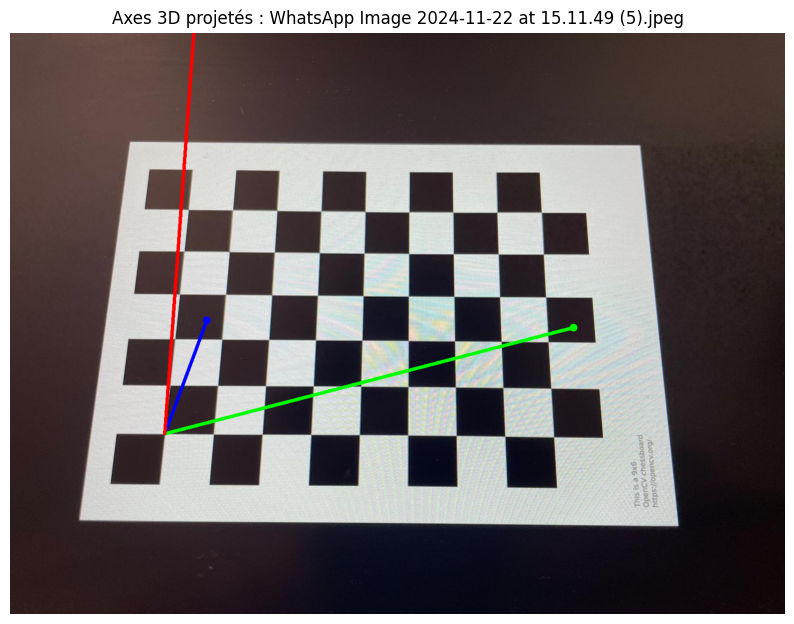

In [ ]:
# Fonction pour dessiner les axes 3D
def draw_axes(img, corners, imgpts):
    corner = tuple(corners[0].ravel().astype(int))
    colors = [(255, 0, 0), (0, 255, 0), (0, 0, 255)]  # Couleurs : Bleu, Vert, Rouge
    for i, pt in enumerate(imgpts):
        img = cv2.line(img, corner, tuple(pt.ravel().astype(int)), colors[i], 5)
        img = cv2.circle(img, tuple(pt.ravel().astype(int)), 8, colors[i], -1)
    return img

# Projeter les axes 3D
for fname in images[:3]:  # Limiter à 3 images pour visualisation
    img = cv2.imread(fname)
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    ret, corners = cv2.findChessboardCorners(gray, CHECKERBOARD, None)

    if ret:
        refined_corners = cv2.cornerSubPix(gray, corners, (11, 11), (-1, -1), criteria)
        _, rvecs, tvecs = cv2.solvePnP(objp, refined_corners, mtx, dist)
        imgpts, _ = cv2.projectPoints(axis, rvecs, tvecs, mtx, dist)

        # Dessiner les axes 3D
        img = draw_axes(img, refined_corners, imgpts)

        # Afficher les axes projetés
        plt.figure(figsize=(10, 10))
        plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
        plt.axis('off')
        plt.title(f"Axes 3D projetés : {os.path.basename(fname)}")
        plt.show()


# Calcul de l'erreur moyenne de reprojection

In [ ]:
# Calcul de l'erreur moyenne de reprojection
mean_error = 0
for i in range(len(objpoints)):
    imgpoints2, _ = cv2.projectPoints(objpoints[i], rvecs, tvecs, mtx, dist)
    error = cv2.norm(imgpoints[i], imgpoints2, cv2.NORM_L2) / len(imgpoints2)
    mean_error += error

mean_error /= len(objpoints)
print(f"Erreur moyenne de reprojection : {mean_error:.6f}")


Erreur moyenne de reprojection : 29.089754
